In [57]:
#loading required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV 
from sklearn.preprocessing import StandardScaler 
from sklearn import datasets 


In [16]:
boston_ = datasets.load_boston()
boston = pd.DataFrame(boston_.data,columns=boston_.feature_names)
boston['PRICE'] = boston_.target

In [18]:
print(boston_.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [19]:
boston.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [20]:
boston.describe() #there were no missing values but there were some extreme values are there should normalize after splitting to prevent data leakage

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [25]:
plt.style.use('dark_background')
import warnings
warnings.filterwarnings("ignore")

<AxesSubplot:xlabel='PRICE', ylabel='Density'>

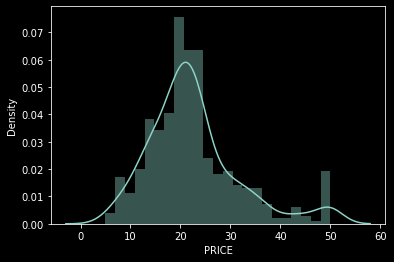

In [26]:

sns.distplot(boston.PRICE)

In [27]:
import pandas_profiling

In [29]:
boston.profile_report()

<AxesSubplot:xlabel='PRICE', ylabel='RAD'>

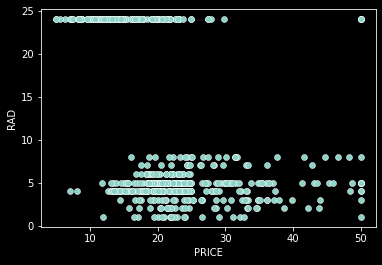

In [30]:
sns.scatterplot(boston.PRICE, boston.RAD)

<AxesSubplot:xlabel='PRICE'>

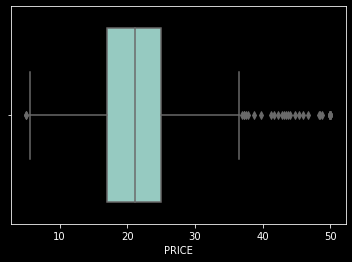

In [31]:
sns.boxplot(boston.PRICE)#there were some outliers in the data

<AxesSubplot:>

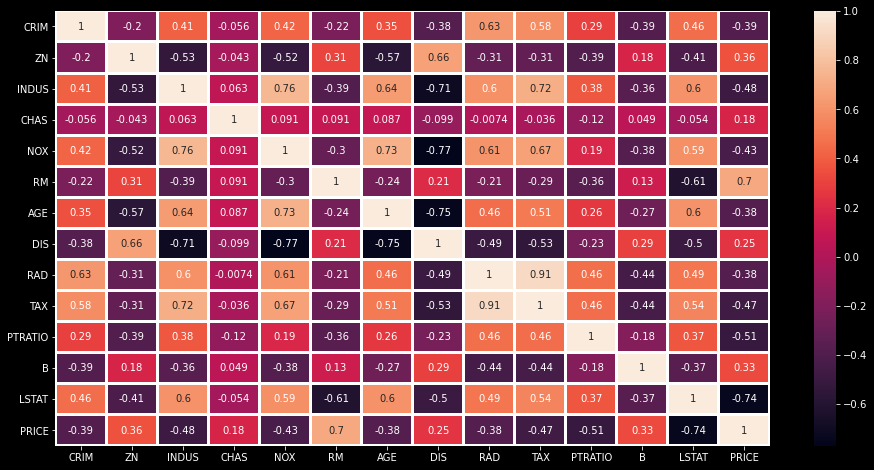

In [38]:
plt.figure(figsize=(16,8))
sns.heatmap(boston.corr(), annot=True, linewidths=2)

In [39]:
boston.drop('TAX', axis=1, inplace=True)#dropping the TAX as TAX and RAD are highly correlated

In [40]:
y = boston['PRICE']
X =boston.drop(columns = ['PRICE'])

Normalize data before or after split of training and testing data?

Don't forget that testing data points represent real-world data. Feature normalization (or data standardization) of the explanatory (or predictor) variables is a technique used to center and normalise the data by subtracting the mean and dividing by the variance. If you take the mean and variance of the whole dataset you'll be introducing future information into the training explanatory variables (i.e. the mean and variance).

Therefore, you should perform feature normalisation over the training data. Then perform normalisation on testing instances as well, but this time using the mean and variance of training explanatory variables. In this way, we can test and evaluate whether our model can generalize well to new, unseen data points.

In [42]:
#split the data 
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size = 0.25,random_state=355)

fit_transform means to do some calculation and then do transformation (say calculating the means of columns from some data and then replacing the missing values). So for training set, you need to both calculate and do transformation.

But for testing set, Machine learning applies prediction based on what was learned during the training set and so it doesn't need to calculate, it just performs the transformation.

In [47]:
from sklearn import preprocessing
normalizer = preprocessing.Normalizer()
X_train_norm = normalizer.fit_transform(x_train)
X_test_norm = normalizer.transform( x_test )

In [50]:
from sklearn.ensemble import RandomForestRegressor
reg = RandomForestRegressor(max_depth=4, random_state=0)
reg.fit(X_train_norm, y_train)

RandomForestRegressor(max_depth=4, random_state=0)

In [51]:
reg.score(X_test_norm,y_test)

0.8390922682935024

In [54]:
#another way
from sklearn.metrics import r2_score
predicted_test = reg.predict(X_test_norm)
test_score = r2_score(y_test, predicted_test)
test_score

0.8390922682935024

In [73]:
grid_param = {
    "n_estimators" : [90,100,115,130],
    'max_depth' : range(2,20,1),
    'min_samples_leaf' : range(1,10,1),
    'min_samples_split': range(2,10,1),
    'max_features' : ['auto','log2']
}

In [74]:
grid_search = GridSearchCV(estimator=  reg,param_grid=grid_param,cv=5,n_jobs =-1,verbose = 3)

In [75]:
grid_search.fit(X_train_norm, y_train)

Fitting 5 folds for each of 10368 candidates, totalling 51840 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(max_depth=4, random_state=0),
             n_jobs=-1,
             param_grid={'max_depth': range(2, 20),
                         'max_features': ['auto', 'log2'],
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'n_estimators': [90, 100, 115, 130]},
             verbose=3)

In [76]:
grid_search.best_params_ 

{'max_depth': 11,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 90}

In [80]:
rand_reg = RandomForestRegressor(
 max_depth = 11,
 max_features = 'auto',
 min_samples_leaf = 1,
 min_samples_split= 3,
 n_estimators = 90,random_state=6)

In [81]:
rand_reg.fit(X_train_norm,y_train)

RandomForestRegressor(max_depth=11, min_samples_split=3, n_estimators=90,
                      random_state=6)

In [83]:
rand_reg.score(X_test_norm,y_test)

0.8598047651153217

In [ ]:
#model is working pretty well